# <center> Практические задания по цифровой обработке сигналов </center>
# <center> Первая лабораторная работа </center>


В данной работе Вы познакомитесь с основными методами работы с аудиоданными в Python. Разбересь в том, как работает свертка, и примените пару интересных фильтров.

# Задание 1. Работа с аудиофайлами в Python (1 балл)

## Теория

Звук - это аналоговый сигнал. То есть он является непрерывным по времени и по значениям. Для того, чтобы работать со звуком на цифровом устройстве, надо преобразовать его в цифровое представление. Для этого надо разделить непрерывный сигнал на промежутки времени (дискретизация сигнала) и разбить непрерывные значения на интервалы (квантование сигнала). Выбраные параметры дискретизации и квантования сигнала напрямую влияют на качество цифрового сигнала. 

<!-- 
## Практика

1. Что хранится в .wav файле? Как узнать параметры дискретизации и квантования .wav файла? 

2. Запишите аудиофайл со своим голосом. Загрузите его. Попробуйте поменять ему частоту дискретизации. Нарисуйте форму волны считанного файла. Воспроизведите полученные сигналы. При какой частоте дискретизации становится невозможно разобрать человеческую речь?   

3. Чем .wav отличается от других кодеков, например .mp3 или .ogg? -->


<!-- ### Подсказка

Записать цифровой сигнал можно при помощи, например, [Audacity](https://www.audacityteam.org) или [Adobe Audition](https://www.adobe.com/ru/products/audition.html). Для считывания файлов воспользуйтесь библиотекой [scipy](https://www.scipy.org) или [librosa](https://librosa.org/doc/latest/index.html). Для воспроизведения аудиофайла удобно использовать класс Audio из модуля IPython.display, а для отрисовки - matplotlib. -->

In [3]:
pip install ffmpeg-python

Note: you may need to restart the kernel to use updated packages.


In [131]:
#!git clone --recurse-submodules https://github.com/Maunberg/dsp.git 

In [132]:
#!rm -rf dsp

In [3]:
import matplotlib.pyplot as plt 
import pandas as pd
import soundfile as sf
import numpy as np
import scipy
from scipy.signal import butter, lfilter
import scipy.io.wavfile as wavfile
from scipy.signal import argrelextrema
from pydub import AudioSegment
from IPython.display import Audio

%matplotlib inline

### 1. Что хранится в .wav файле? Как узнать параметры дискретизации и квантования .wav файла?

В wav файле хранятся:
1. Цифровая копия звуковой волны
2. Метаданные:
  - Частота дискретизации: Количество отсчетов (сэмплов) в секунду. Определяет верхний предел воспроизводимых частот.
  - Разрядность (глубина квантования): Количество бит, используемых для представления каждого отсчета. Определяет динамический диапазон и разрешение звука.
  - Количество каналов: Моно (один канал) или стерео (два канала).
  - Формат кодирования: Обычно используется линейное PCM (Pulse-Code Modulation).

In [77]:
filename = 'dsp/first_part/1/gimn-rossii.wav'
file = sf.SoundFile(filename)
file

SoundFile('/kaggle/working/dsp/first_part/1/gimn-rossii.wav', mode='r', samplerate=44100, channels=2, format='WAV', subtype='PCM_16', endian='FILE')

Как можно заметить, samplerate (частота дискретизации) 44100 Гц, 2 сhannels (канала), тип квантования PCM_16.

In [78]:
file.samplerate, file.channels, file.subtype

(44100, 2, 'PCM_16')

### 2. Запишите аудиофайл со своим голосом. Загрузите его. Попробуйте поменять ему частоту дискретизации. Нарисуйте форму волны считанного файла. Воспроизведите полученные сигналы. При какой частоте дискретизации становится невозможно разобрать человеческую речь?

**Подсказка**

Записать цифровой сигнал можно при помощи, например, [Audacity](https://www.audacityteam.org) или [Adobe Audition](https://www.adobe.com/ru/products/audition.html). Для считывания файлов воспользуйтесь библиотекой [scipy](https://www.scipy.org) или [librosa](https://librosa.org/doc/latest/index.html). Для воспроизведения аудиофайла удобно использовать класс Audio из модуля IPython.display, а для отрисовки - matplotlib.

In [135]:
filename = 'dsp/first_part/1/my_voice.wav'
file = sf.SoundFile(filename)
print('Частота дискретизации:', file.samplerate)

Частота дискретизации: 44100


In [80]:
print("Исходный сигнал:")
display(Audio(filename))

Исходный сигнал:


In [8]:
def plot_audio(audios, labels, start_frame_rate=44100):
    for audio, label in zip(audios, labels):
        samples = np.array(audio.get_array_of_samples())
        if audio.channels == 2:
            samples = samples.reshape((-1, 2))
            channel_1 = samples[:, 0]
            channel_2 = samples[:, 1]
        else:
            channel_1 = samples
        time = np.linspace(0, len(channel_1) / audio.frame_rate, num=len(channel_1))
        plt.plot(time, channel_1, label=label)
    plt.title('График, отображающий сигнал')
    plt.xlabel('Время (секунды)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.show()

In [90]:
def process_wav(input_file, output_file, new_rate, end_sample=0, start_sample=0):
    if end_sample == 0:
        end_sample = new_rate
    audio = AudioSegment.from_file(input_file)
    ['Изначальное аудио (1 канал)']
    audio_new = audio.set_frame_rate(new_rate)
    audio_new.export(output_file, format="wav")
    plot_audio([audio, audio_new], ['Изначальное (44.1 кГц)', f'Изменённое ({new_rate/1000} кГц)'])

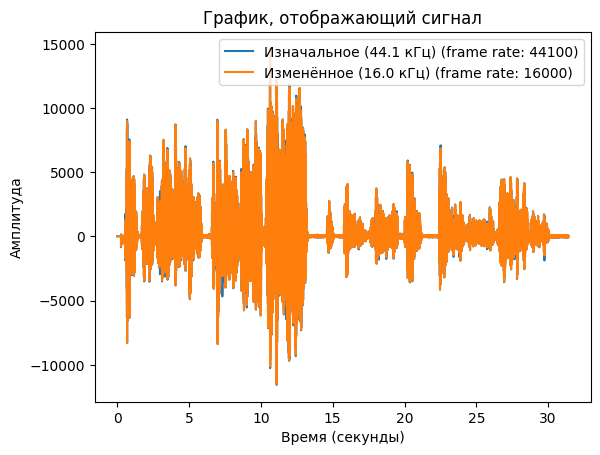

Измененный сигнал:


In [100]:
new_rate = 16_000
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
display(Audio(output_file, rate=new_rate))

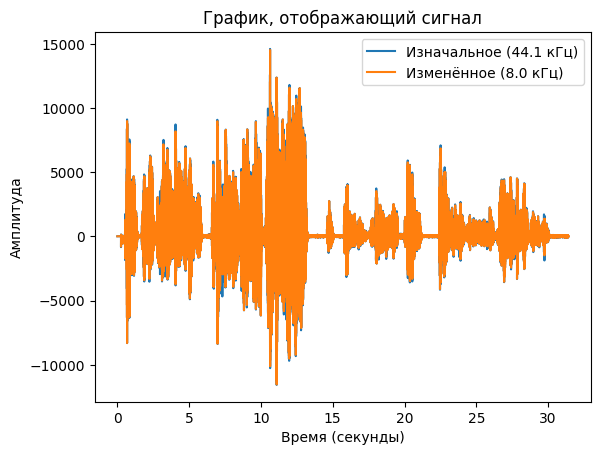

Измененный сигнал:


In [92]:
new_rate = 8000
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
display(Audio(output_file, rate=new_rate))

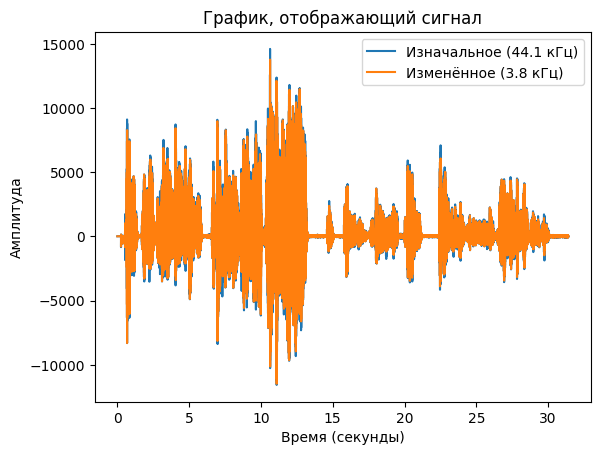

Измененный сигнал:


In [112]:
new_rate = 3800
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
display(Audio(output_file, rate=new_rate))

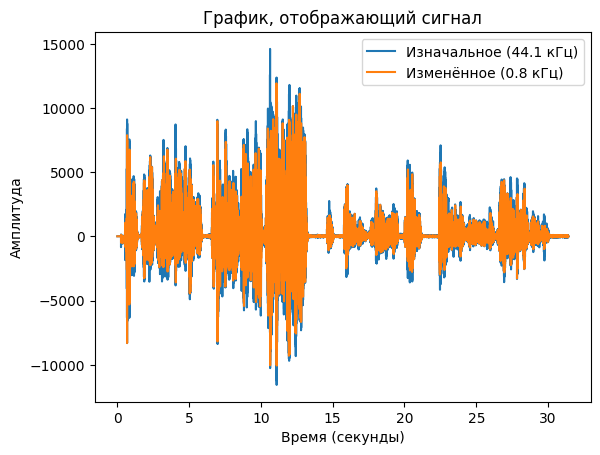

Измененный сигнал:


In [116]:
new_rate = 800
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
# display(Audio(output_file, rate=new_rate)) приказал жить от таких фокусов с частотой дискретизации
AudioSegment.from_file(output_file)

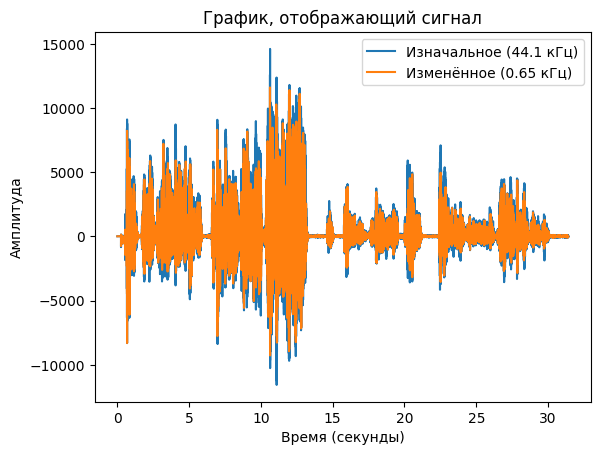

Измененный сигнал:


In [118]:
new_rate = 650
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
# display(Audio(output_file, rate=new_rate)) приказал жить от таких фокусов с частотой дискретизации
AudioSegment.from_file(output_file)

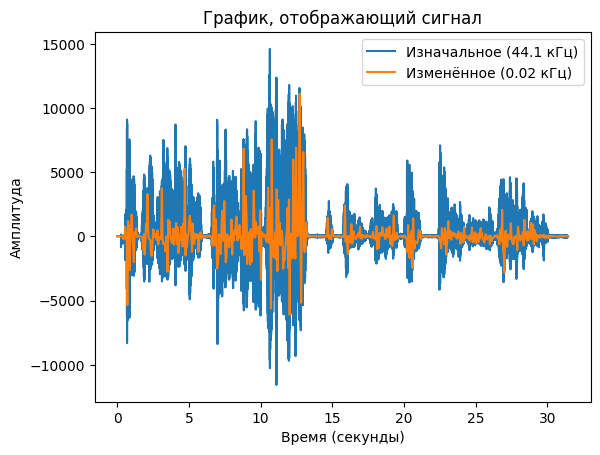

Измененный сигнал:


In [121]:
# тут люди даже ничего не услышат
new_rate = 20
output_file = f'mv_{new_rate}.wav'
process_wav(filename, output_file, new_rate)
print("Измененный сигнал:")
# display(Audio(output_file, rate=new_rate)) приказал жить от таких фокусов с частотой дискретизации
AudioSegment.from_file(output_file)

При сокращении частоты дискретизаци до 1600 мы практически не слышим изменений в аудиосигнале. При 8 кГц уже прослеживается телефонный эффект. Но какая частота уже не позволит услышать речь? Для моего голоса – от 800 Гц.

Когда я учился на военной кафедре на связиста, то нам также говорили, что диапазон частот для различения человеческой речи – 800-3200 кГц (речь в этом диапазоне достаточно чёткая и смыслоразличительная).

### 3. Чем .wav отличается от других кодеков, например .mp3 или .ogg?

<table>
    <tr>
        <th>Формат</th>
        <th>Тип кодека</th>
        <th>Сжатие</th>
        <th>Качество</th>
        <th>Размер файлов</th>
        <th>Применение</th>
    </tr>
    <tr>
        <td>WAV (.wav)</td>
        <td>Не сжатый формат</td>
        <td>Обычно отсутствует (хранит аудио в виде несжатых PCM данных), хотя может поддерживать сжатие с потерями и без потерь</td>
        <td>Очень высокое, так как аудио хранится в оригинальном несжатом виде. WAV-файлы практически идентичны исходным звуковым сигналам</td>
        <td>Очень большой, так как не используется сжатие</td>
        <td>Идеален для записи и редактирования аудио, где важна максимальная точность (например, профессиональная звукозапись, редактирование аудио)</td>
    </tr>
    <tr>
        <td>MP3 (.mp3)</td>
        <td>Сжатый формат с потерями</td>
        <td>С потерями — использует сжатие, которое отбрасывает часть звуковой информации, чтобы значительно уменьшить размер файла</td>
        <td>Качество может варьироваться, но обычно ниже, чем у WAV, особенно на низких битрейтах (например, 128 кбит/с). При высоких битрейтах (320 кбит/с) качество может быть довольно высоким и почти незаметно отличаться от оригинала для большинства слушателей</td>
        <td>Значительно меньший, чем WAV, благодаря сжатию</td>
        <td>Широко используется для распространения музыки и аудио в интернете, на мобильных устройствах и плеерах, где важен баланс между качеством и размером файла</td>
    </tr>
    <tr>
        <td>OGG Vorbis (.ogg)</td>
        <td>Сжатый формат с потерями</td>
        <td>С потерями, как и MP3, но использует более эффективные алгоритмы сжатия</td>
        <td>Сравнимо с MP3, но при равных битрейтах OGG часто обеспечивает лучшее качество звука. OGG Vorbis считается более эффективным кодеком, чем MP3, особенно на низких битрейтах</td>
        <td>Размер файла зависит от битрейта, но обычно он меньше, чем у MP3 при сопоставимом качестве</td>
        <td>Популярен в открытых системах и программах с открытым исходным кодом, например, для потокового вещания. Широко используется в играх и приложениях благодаря своей эффективности</td>
    </tr>
</table>

Вообще, мы на работе для предсказательных моделей на основе аудио всегда используем wav, он самый качественный, хотя и занимает много места.
<html lang="ru">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        .tabulated {
            padding-left: 50px;
        }
    </style>
</head>
<body>
    <ul>
        <li class="tabulated">mp3&nbsp;&nbsp;&nbsp;9 458&nbsp;&nbsp;&nbsp;KБ</li>
        <li class="tabulated">ogg&nbsp;&nbsp;&nbsp;2 822&nbsp;&nbsp;&nbsp;&nbsp;KБ</li>
        <li class="tabulated">wav&nbsp;&nbsp;&nbsp;41 677&nbsp;&nbsp;KБ</li>
    </ul>
</body>
</html>

## Теория
[Гармонические колебания](https://ru.wikipedia.org/wiki/Гармонические_колебания) -  колебания, при которых физическая величина изменяется с течением времени по гармоническому (синусоидальному/косинусоидальному) закону. 

В общем случае гармонические колебания задаются формулой:

$$y=A \cos(\omega t+\varphi_0)$$

где $А$ - это амплитуда, $\omega$ – циклическая частота (радиан/с), $\varphi$ - фаза (сдвиг), $t$ – время. 


# Задание 2. Гармонические сигналы (1 балл)

In [9]:
# Сначала определим функцию для отрисовки сигнала с хорошим масштабом и сеткой
# Это поможет легче анализировать сигнал

# Я немного её переписал для своего удобства
def draw_signal(datas, labels=['Оригинальный сигнал'], figsize=(8, 8)):
    if isinstance(datas, np.ndarray): 
        datas = [datas]
    colors = ['green', 'red', 'blue', 'orange'][:len(datas)]

    plt.figure(figsize=figsize)
    for data, label, color in zip(datas, labels, colors):
        plt.plot(data, label=label, color=color, linewidth=2)
    
    plt.minorticks_on()
    plt.xticks(np.arange(0, 1000, step=100))
    plt.yticks(np.arange((data.min().round()) // 10 * 10, 
                         (data.max().round()) // 10 * 10 + 10, step=5))
    plt.grid(which='major', color='k', linewidth=1)
    plt.grid(which='minor', color='k', linestyle=':')
    
    if len(datas) > 1:
        plt.title('Сравнение сигналов')
    else:
        plt.title('График сигнала')
    
    plt.xlabel('Время (мс)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.show()

In [137]:
# Читаем данные с подготовленными сигналами
import pickle
with open("dsp/first_part/dsp_labs_book/resources/data.pickle", "rb") as f:
    test_data = pickle.load(f)
# Теперь можно приступать к практике!

## Практика

Постройте графики трех сигналов a, b и c из test_data['task2']. Попробуйте подобрать коэффициенты для этих сигналов. Сгенерируйте сигналы (1000 отсчетов) с подобранными коэффициентами. Постройте графики сгенерированных сигналов и пройдите тест на схожесть с оригинальным.


Подсказка. Фаза, период и амплитуда сигнала - целочисленные. Для генерации пользуйтесь библиотекой numpy и функциями arange, sin, cos.

### Сигнал ***a***

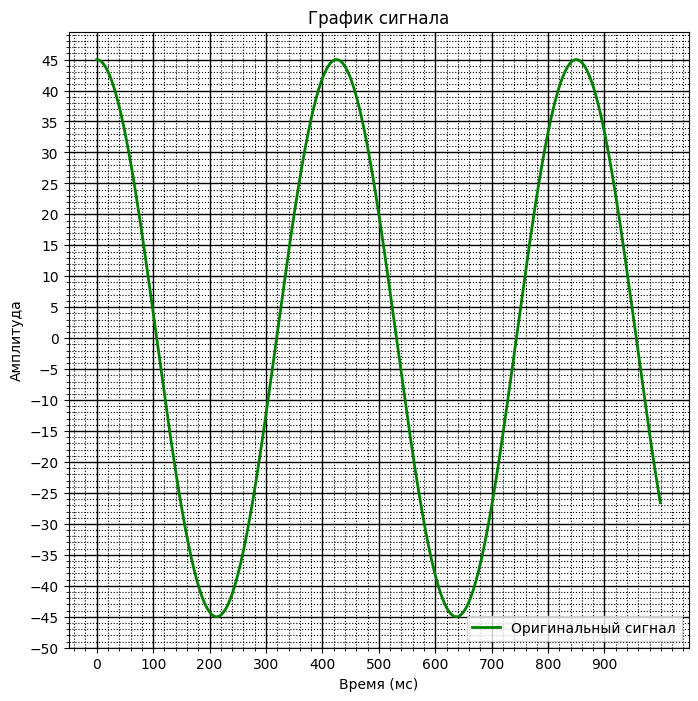

In [493]:
original_a = test_data['task2']['a']
draw_signal(original_a)

In [561]:
A = 45       
omega = 1.48
phi = 0
t = np.arange(0, 10, 0.01)
a = A * np.cos(omega * t + phi)

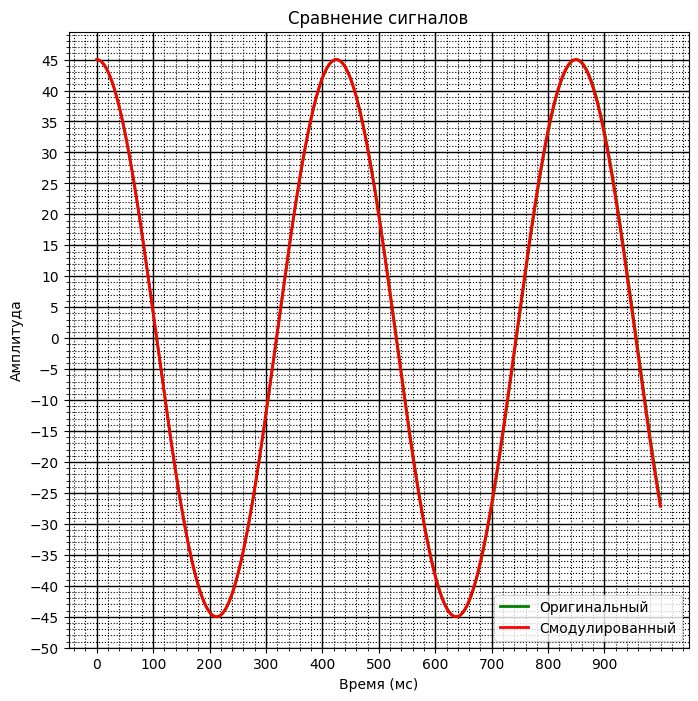

In [562]:
draw_signal([original_a, a], ['Оригинальный', 'Смодулированный'])

Проверка на сходство:

In [563]:
similarity = np.corrcoef(original_a, a)[0, 1]
similarity

0.9999516395219332

Я потом только заметил этот код, поэтому буду сразу два использовать:

In [564]:
assert len(a) == 1000
assert np.allclose(a, test_data["task2"]["a"], atol=1)
print("Ok!")

Ok!


**Подобранные коэффициенты для сигнала 'a':**

1. Амплитуда - $A= $ 45

2. Угловая частота ($ \displaystyle\omega =\frac{2\pi}{T}) = $ 1.48

3. Фаза - $\phi= $ 0

### Сигнал ***b***

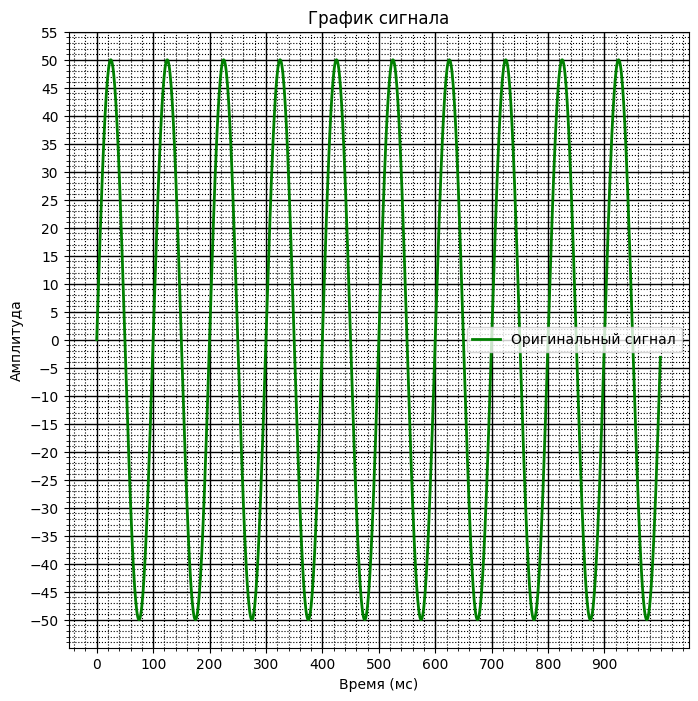

In [499]:
original_b = test_data['task2']['b']
draw_signal(original_b)

Я подобрал ручками.

In [500]:
A = 50      
omega = 6.3
phi = -1.57
t = np.arange(0, 10, 0.01)
b = A * np.cos(omega * t + phi)

Посмотрел, что по графику всё практически одинаково.

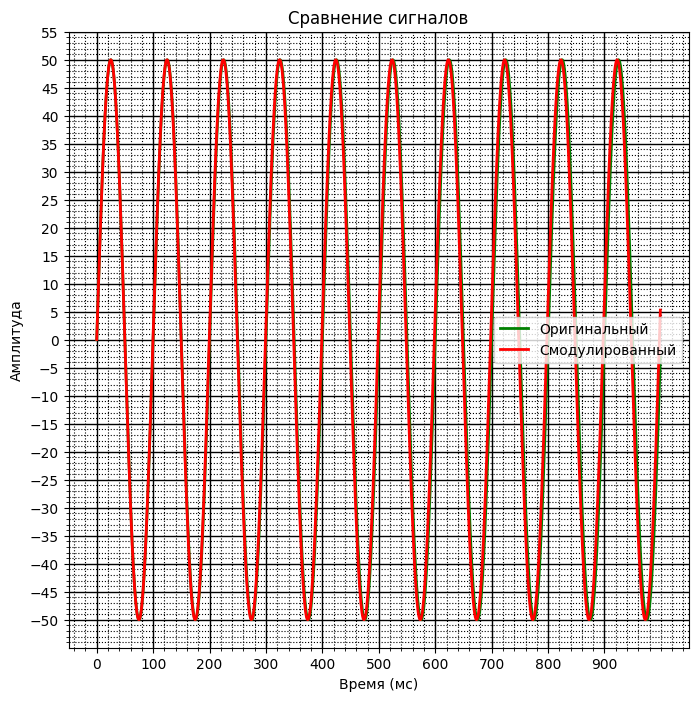

In [501]:
draw_signal([original_b, b], ['Оригинальный', 'Смодулированный'])

И по корреляции:

In [502]:
similarity = np.corrcoef(original_b, b)[0, 1]
print(similarity)

0.9952152671803894


Но np.allclose не хотел работать, видел неточности.

In [503]:
assert len(b)== 1000
assert np.allclose(b, test_data["task2"]["b"], atol=1)
print("Ok!")

AssertionError: 

Поэтому я немного схитрил и попробовал написать функцию, которая высчитывает параметры исходя из самого массива сигнала. (не обессудьте, я постарался разобраться)

In [506]:
def generate_args(signal):
    
    t = np.arange(0, 10, 0.01)
    
    A = np.max(signal) # А - это максимальное значение в сигнале
    
    #нахождения локальных экстремумов (np.greater = максимумов)
    peaks = argrelextrema(signal, np.greater)[0]
    #пример: array([ 25, 125, ...])
    
    if len(peaks) > 1:
        # вычисляется средний период T благодаря среднему расстоянию между пиков
        T = np.mean(np.diff(peaks)) * 0.01
        omega = 2 * np.pi / T
        # 2 * np.pi соответствует одному полному циклу в радианах, а потом нужно разделить это на количество полных циклов в секунду
    else:
        omega = 0
    
    if A != 0:
        # берём единичный пример сигнала на t=0
        # в этом случае нам даже не нужна omega, что позволяет не смещаться на неё
        # t0 = 0
        signal_t0 = signal[0]
        
        phi = - np.arccos(signal_t0 / A) #- omega * t0 = - 0
        phi = np.mod(phi + np.pi, 2 * np.pi) - np.pi
    else:
        phi = 0
    
    print('A = ', A)
    print('T = ', T)
    print('Omega = ', omega)
    print('Phi =', phi)
    
    generated = A * np.cos(omega * t + phi)
    print('Коэффициент корреляции:', np.corrcoef(signal, generated)[0, 1])
    print('Сигналы близки:', np.allclose(generated, signal, atol=1))
    
    return A, omega, phi

Тестирую и тут корреляция равна 1!

In [507]:
A, omega, phi = generate_args(original_b)
b = A * np.cos(omega * t + phi)

A =  50.0
T =  1.0
Omega =  6.283185307179586
Phi = -1.5707963267948966
Коэффициент корреляции: 1.0
Сигналы близки: True


Функция тоже работает. Как можно заметить, для моделирования сигнала потребовались отнюдь не целые числа.

In [508]:
assert len(b)== 1000
assert np.allclose(b, test_data["task2"]["b"], atol=1)
print("Ok!")

Ok!


Проверил также на сигнале a. 

In [509]:
_, _, _ = generate_args(original_a)

A =  45.0
T =  4.25
Omega =  1.478396542865785
Phi = 0.0
Коэффициент корреляции: 1.0
Сигналы близки: True


**Подобранные коэффициенты для сигнала 'b':**

1. Амплитуда - $A= $ 50

2. Угловая частота ($ \displaystyle\omega =\frac{2\pi}{T}) = $ 6.283185307179586

3. Фаза - $\phi= $ -1.5707963267948966

### Сигнал ***c***

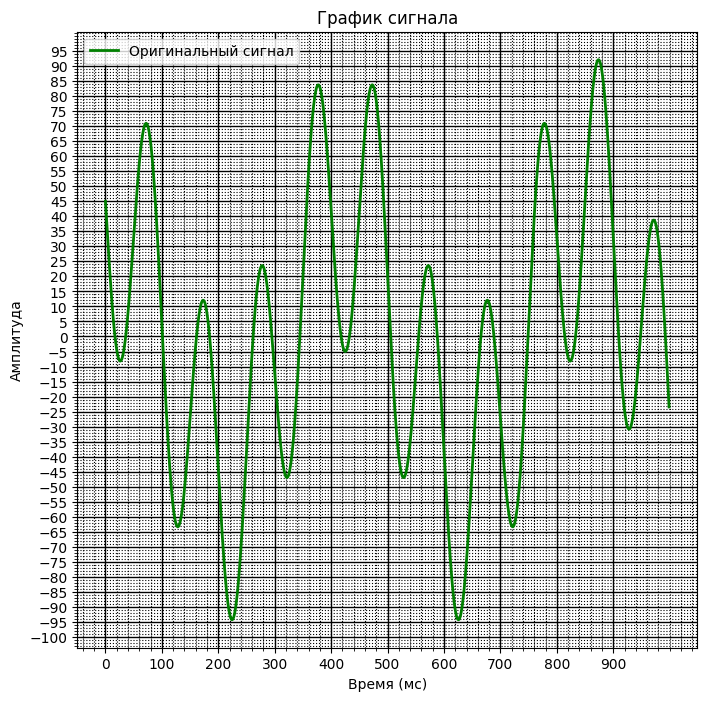

In [510]:
original_c = test_data['task2']['c']
draw_signal(original_c)

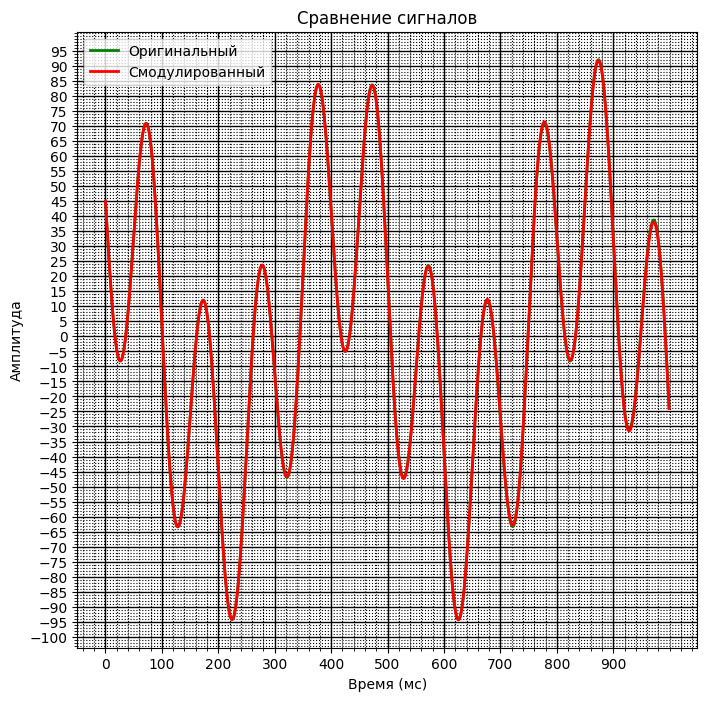

In [511]:
c = a - b
draw_signal([original_c, c], ['Оригинальный', 'Смодулированный'])

In [512]:
assert len(c)== 1000
assert np.allclose(c, test_data["task2"]["c"], atol=1)
print("Ok!")

Ok!


# Задание 3. Свертка (3 балла)

## Теория
Одна из наиболее частых операций, которая выполняется при обработке сигналов, это свёртка. Свёртка имеет много различных применений, например, с ее помощью можно убрать из сигнала шумы или применить к сигналу эффект эхо.


Свёртка — это математическая операция, применённая к двум функциям f и g и порождающая третью функцию. Операцию свёртки можно интерпретировать как «схожесть» одной функции с отражённой и сдвинутой копией другой.  Другими словами, преобразование свёртки однозначно определяет выходной сигнал y(t) для установленного значения входного сигнала x(t) при известном значении функции импульсного отклика системы h(t).

<!-- ![Convolution](resources/Convolution_of_box_signal_with_itself2.gif "Convolution") -->
![Convolution](resources/Convolution_of_box_signal_with_itself2.gif "Convolution")

Формула свёртки:
$$y_t=\frac{1}{2} \int_0^T x(\tau)h(t-τ)dτ$$
где $\tau$  - длительность импульсной переходной характеристики.

## Практика
Реализуйте операцию свёртки. Сравните её с существующей реализацией scipy.signal.convolve. Постройте графики фильтра, исходного сигнала и результата свертки.

In [5]:
def convolve(x, h):
    Nx = len(x)
    Nh = len(h)
    Ny = Nx + Nh - 1
    y = [0] * Ny

    for n in range(Ny):
        for k in range(Nx):
            if 0 <= n-k < Nh:
                y[n] += x[k] * h[n-k]

    return y

In [546]:
x = convolve(a, b)
print(x)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 3, 6, 8, 9, 9, 9, 9, 9, 9, 8, 6, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [547]:
def test_convolve(a, b, print_debug=False):
    my_result = convolve(a, b)
    scipy_result = scipy.signal.convolve(a, b, method='direct')
    if print_debug:
        print(f"Your result {my_result}")
        print(f"Scipy result {scipy_result}")
    assert np.allclose(my_result, scipy_result), f"Test {a} conv {b} failed"
    print("Ok!")

In [548]:
a = np.repeat([0,1,0], 10)
b = np.array([0,1,2,3,2,1,0])

In [549]:
test_convolve(a, b, print_debug=False)

Ok!


### Нарисуйте результат свертки a и b

Сигнал **а**

In [2]:
A = 45       
omega = 1.48
phi = 0
t = np.arange(0, 10, 0.01)
a = A * np.cos(omega * t + phi)

Сигнал **b**

In [3]:
A = 50      
omega = 6.3
phi = -1.57
t = np.arange(0, 10, 0.01)
b = A * np.cos(omega * t + phi)

Свертка **a** и **b**

In [6]:
conv_a_b = np.array(convolve(a, b))

In [7]:
len(a), len(b), len(conv_a_b)

(1000, 1000, 1999)

Все 3 графика на одной картинке:

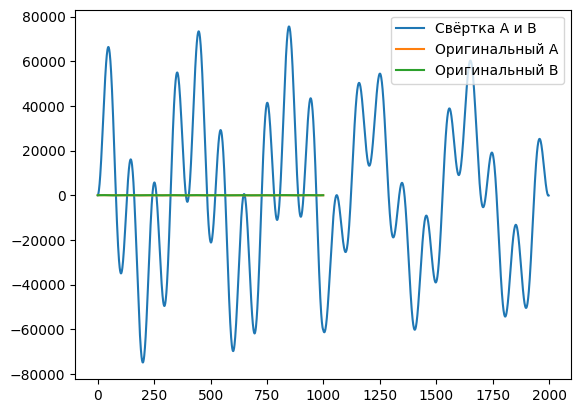

In [12]:
xpoints = np.array(range(0,len(conv_a_b)))
ypoints = conv_a_b
plt.plot(xpoints, ypoints, label = 'Свёртка А и B')
plt.plot(range(len(a)), a, label = 'Оригинальный A')
plt.plot(range(len(b)), b, label = 'Оригинальный B')
plt.legend()
plt.show()

In [ ]:
# съедает слишком много памяти :(
#draw_signal([a, b, conv_a_b], ['Оригинальный A', 'Оригинальный B', 'Свёртка А и B']) 

# Задание 4. * Алгоритм Карплуса-Стронга 

Реализуйте  [Алгоритм Карплуса-Стронга](https://en.wikipedia.org/wiki/Karplus%E2%80%93Strong_string_synthesis). В качестве фильтра используйте усреднитель двух смежных отсчетов. Проверьте результат. 

Отрисуйте и воспроизведите полученный сигнал. На что влияют параметры генерации? Попробуйте имитировать звучание разных струн гитары.

In [31]:
def karplus_strong(noise, N):
    # Noise - input
    # N - number of samples to generate
    # return y - generated signal based on Noise
    
    alpha = 0.5
    y = np.zeros(N)
    L = len(noise)
    for n in range(N):
        a = noise[n] if n < L else 0
        b = y[n-L]*alpha if n>=L else 0
        c = y[n-L-1]*alpha if n>=L+1 else 0
        y[n] = a + b + c
    return y

   

#     raise NotImplementedError()

In [32]:
np.random.seed(seed=1)
sample_rate = 44100 
frequency = 82.41
sec = 2
gen_len = sample_rate * sec
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency))) # [-1, 1]

gen_wav = karplus_strong(noise, gen_len)
assert np.allclose(gen_wav[:len(noise)], noise), "Generated signal must starting with noise"
assert np.allclose(gen_wav[len(noise)], (noise[0])/2), "Out of range samples eq 0."
assert np.allclose(gen_wav[len(noise)+1: 2*len(noise)], (noise[:-1] + noise[1:])/2), \
    "Bad requrent rule( 1 iteration)"
assert np.allclose(gen_wav[2*len(noise)], (noise[0]/2 + noise[-1])/2), \
    "Bad requrent rule( 2 iteration)"
assert np.allclose(gen_wav[2*len(noise)+2: 3*len(noise)], \
                   (((noise[:-1] + noise[1:])/2)[:-1] + ((noise[:-1] + noise[1:])/2)[1:])/2), \
    "Bad requrent rule( 3 iteration)"
print('All Ok!')

All Ok!


### Попробуем покрутить параметры генерации

Сгенерируем гитарные ноты:

In [50]:
def make_note(frequency, sample_rate, duration):
    gen_len = int(sample_rate * duration)
    noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency)))
    return karplus_strong(noise, gen_len)

In [15]:
data = [[j.strip() for j in i.split(',')] for i in'''Название, Hота ,Суб-контp октава ,Контp октава ,Большая октава ,Малая октава ,1,2,3,4,5
до, C,,32.70 ,65.41 ,130.82 ,261.63 ,523.25 ,1046.50 ,2093.00 ,4186.00 
до диез, C#,,34.65 ,69.30 ,138.59 ,277.18 ,554.36,1108.70,2217.40 ,4434.80 
ре, D,,36.95 ,73.91 ,147.83 ,293.66 ,587.32 ,1174.60 ,2349.20 ,4698.40 
ре диез, D#,,38.88 ,77.78 ,155.56 ,311.13 ,622.26 ,1244.50 ,2489.00 ,4978.00 
ми, E,20.61 ,41.21 ,82.41 ,164.81 ,329.63 ,659.26 ,1318.50,2637.00,5274.00 
фа, F,21.82 ,43.65 ,87.31 ,174.62 ,349.23 ,698.46 ,1396.90 ,2793.80 ,
фа диез, F#,23.12 ,46.25 ,92.50 ,185.00 ,369.99 ,739.98 ,1480.00 ,2960.00,
соль, G,24.50 ,49.00 ,98.00 ,196.00 ,392.00 ,784.00 ,1568.00 ,3136.00 ,
соль диез, G#,25.95 ,51.90 ,103.80 ,207.00 ,415.30 ,830.60 ,1661.20 ,3332.40 ,
ля, A,27.50 ,55.00 ,110.00 ,220.00 ,440.00 ,880.00 ,1720.00 ,3440.00 ,
си, B,29.13 ,58.26 ,116.54,233.08 ,466.16 ,932.32 ,1864.60 ,3729.20 ,
си бемоль, H ,30.87 ,61.74 ,123.48 ,246.96 ,493.88 ,987.75 ,1975.50 ,3951.00'''.split('\n')]
data = pd.DataFrame(data[1:], columns=data[0])#.set_index(['Hота'])
data

,Название,Hота,Суб-контp октава,Контp октава,Большая октава,Малая октава,1,2,3,4,5
0,до,C,,32.70,65.41,130.82,261.63,523.25,1046.50,2093.00,4186.00
1,до диез,C#,,34.65,69.30,138.59,277.18,554.36,1108.70,2217.40,4434.80
2,ре,D,,36.95,73.91,147.83,293.66,587.32,1174.60,2349.20,4698.40
3,ре диез,D#,,38.88,77.78,155.56,311.13,622.26,1244.50,2489.00,4978.00
4,ми,E,20.61,41.21,82.41,164.81,329.63,659.26,1318.50,2637.00,5274.00
5,фа,F,21.82,43.65,87.31,174.62,349.23,698.46,1396.90,2793.80,
6,фа диез,F#,23.12,46.25,92.50,185.00,369.99,739.98,1480.00,2960.00,
7,соль,G,24.50,49.00,98.00,196.00,392.00,784.00,1568.00,3136.00,
8,соль диез,G#,25.95,51.90,103.80,207.00,415.30,830.60,1661.20,3332.40,
9,ля,A,27.50,55.00,110.00,220.00,440.00,880.00,1720.00,3440.00,


In [208]:
part1 = '''E|-------1-------1---------1-------1---------0-------0------0-------0--5-|
B|---------3---3---3---3-----1---1---1---1-----2---2---2--2---2---2------|
G|-----------2-------2---------2-------2---------2------2-------2--------|
D|-----------------------------------------------------------------------|
A|-----------------------------------------------------------------------|'''
part2 = '''E|-----0---1-------5---3----5----------------0----1----0-----3----5---3---1-------------|
B|-3----------------------------1------3------------------------------------------------|
G|--------------------------------------------------------------------------------------|
D|--------------------------------------------------------------------------------------|
A|--------------------------------------------------------------------------------------|'''

In [237]:
def get_freq(name, part='2'):
    part = str(part)
    if part == '0':
        part = '1'
    if name in data['Название'].values:
        return float(data[data['Название']==name][part])
    elif name in data['Hота'].values:
        return float(data[data['Hота']==name][part])

def full_chord(line, length=1):
    proc = make_note(get_freq(*line[0]), 44100, length)
    if len(line[1:]) > 0:
        for note in line[1:]:
            proc += make_note(get_freq(*note), 44100, length)
    return proc

In [243]:
def create_part_preprocess(part):
    part = part.split('\n')
    process = []
    first = True
    for i in zip(*part):
        if '|' in i:
            continue
        if first:
            notes = i
            first = False
        else:
            sub = []
            for j, n in zip(i, notes):
                if j!='-':
                    sub.append([n, j])
            process.append(sub)
    return process 

def create_part(process, time=0.5, back=22050, sample_rate=44100):
    result = np.zeros(int(sample_rate*time))
    for i in process:
        if i == []:
            continue
            note = np.zeros(sample_rate)
            result = np.append(result, note[back:])
        else:
            note = full_chord(i, time)
            result[-back:] += note[:back]
            result = np.append(result, note[back:])
    return result

In [212]:
melody = create_part(create_part_preprocess(part1))
melody = np.append(melody, create_part(create_part_preprocess(part2)))

/tmp/ipykernel_30/2138770579.py:8: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return float(data[data['Hота']==name][part])


In [213]:
Audio(data=melody, rate=44100)

In [125]:
# тут просто ноты аккордов, думал сначала из них что-то составить, но в итоге по нотам оказалось найти материал проще
# chords = {
#     'C': [['E', 1], ['B', 2], ['G', 3]],
#     'D': [['F#', 2], ['A', 3], ['D', 2]],
#     'E': [['B', 2], ['G#', 3], ['D', 4]],
#     'F': [['C', 1], ['F', 3], ['A', 2]],
#     'G': [['D', 3], ['G', 3], ['B', 3]],
#     'A': [['E', 2], ['A', 2], ['C#', 2]],
#     'B': [['F#', 2], ['B', 2], ['D#', 3]],

#     'Am': [['A', 1], ['C', 2], ['E', 2]],
#     'Dm': [['D', 1], ['F', 3], ['A', 2]],
#     'Em': [['E', 0], ['B', 2], ['G', 3]],
#     'Fm': [['F', 1], ['Ab', 3], ['C', 2]],
#     'Gm': [['G', 3], ['Bb', 3], ['D', 3]],
#     'Bm': [['B', 2], ['D', 2], ['F#', 3]],

#     'G7': [['D', 3], ['G', 3], ['B', 3], ['F', 1]],
#     'C7': [['E', 1], ['B', 2], ['G', 3], ['D', 1]],
#     'Am7': [['A', 1], ['C', 2], ['E', 2], ['G', 2]],
#     'Dm7': [['D', 1], ['F', 3], ['A', 2], ['C', 1]],
#     'E7': [['B', 2], ['G#', 3], ['D', 4], ['F#', 1]],
# }

In [266]:
# Самая новогодняя песенка. :)
melody = create_part([[[i, '2']] for i in 'E E E G C D E F F F F F E E E E E D D E D G E E E E E E E G C D E F F F F F E E E E G G F D C'.split()], 1, 30000)
Audio(data=melody, rate=44100)

/tmp/ipykernel_30/2138770579.py:8: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return float(data[data['Hота']==name][part])


In [265]:
# Гравити Фолз (ноты не совсем точные, но мелодия угадывается)
melody = create_part([[[i[0], str(i[1])]] for i in [['ре', 2], ['ре', 3], ['ми', 2], ['фа', 2], ['ре', 3], ['ля', 2], ['фа', 3], ['соль', 2], ['ля', 2], ['до', 2], ['фа', 3], ['ре', 2], 
                                                    ['си', 3], ['ми', 2], ['фа', 2], ['си', 3], ['ми', 2], ['соль', 2], ['ля', 2], ['соль', 2], ['фа', 2], ['ре', 3], ['фа', 2], ['фа', 2], 
                                                    ['фа', 2], ['ля', 2], ['ре', 3], ['ля', 2], ['соль', 2], ['фа', 2], ['фа', 3], ['ля', 2], ['ля', 2], ['ля', 2], ['фа', 3], ['соль', 2], 
                                                    ['ля', 2], ['соль', 2], ['фа', 2], ['соль', 3], ['фа', 2], ['фа', 2], ['фа', 2], ['ля', 2], ['соль', 3], ['ля', 2], ['соль', 2], ['фа', 2],
                                                    ['ля', 3], ['ля', 2], ['ля', 2], ['ля', 2], ['до', 2], ['до', 2], ['до', 2], ['до', 2]
                                                   ]], 0.75, 15000)
Audio(data=melody, rate=44100)

/tmp/ipykernel_30/2138770579.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return float(data[data['Название']==name][part])


In [64]:
melody = [
    ['C', 0.5],
    ['D', 0.25],
    ['E', 0.25],
    ['F', 0.5],
    ['G', 0.25],
    ['G#', 0.25],
    ['A', 0.5],
    ['B', 0.5]
]

In [72]:
music = []
for i in melody:
    music.extend(make_note(get_freq(i[0]), 44100, i[1]))
Audio(data= music, rate=44100)

Визуализируем затухание амплитуды:

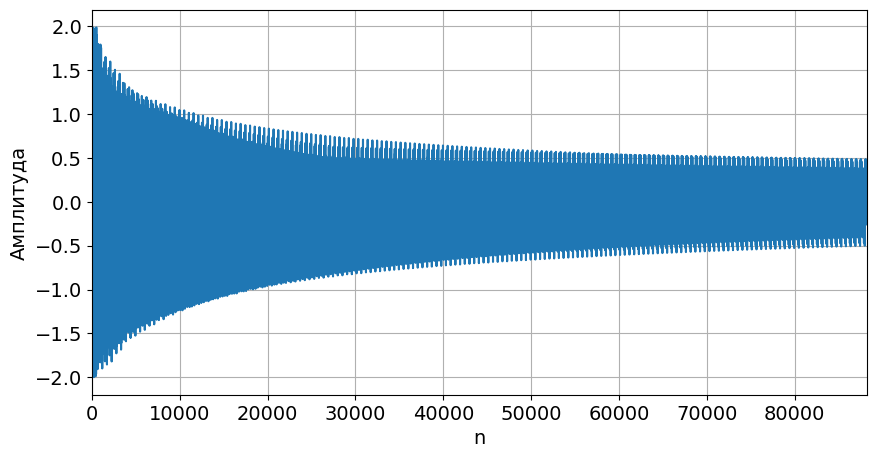

In [73]:
plt.figure(figsize=(10,5))
plt.xlabel('n', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.xlim(0, gen_len)
plt.plot(np.linspace(0, gen_len+1, gen_len), gen_wav)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.grid()

Визуализируйте затухание амплитуд гитарных нот:

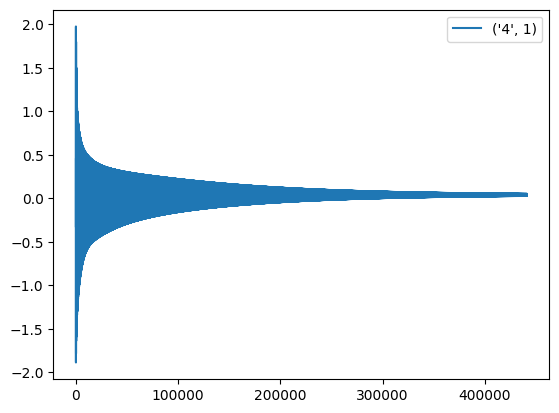

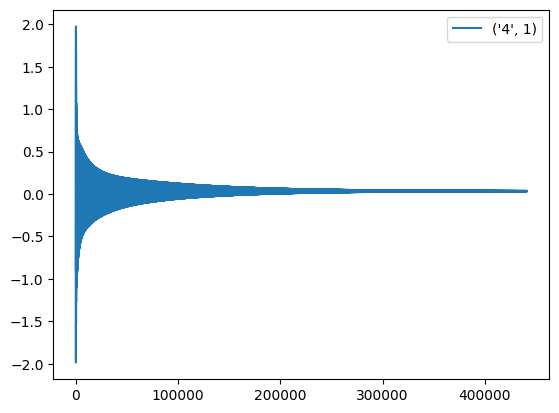

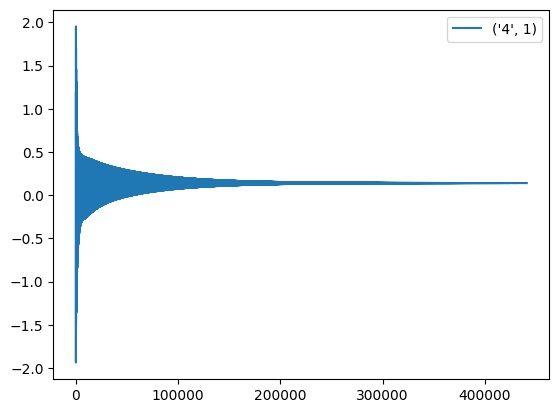

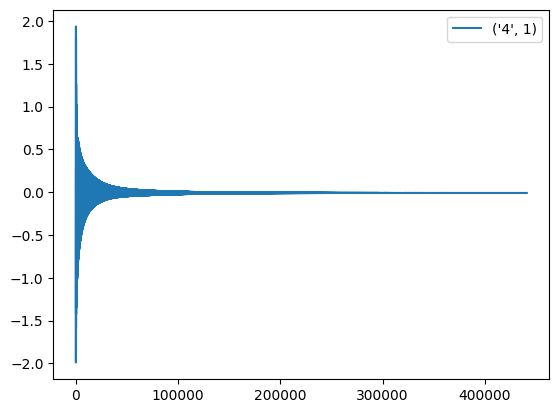

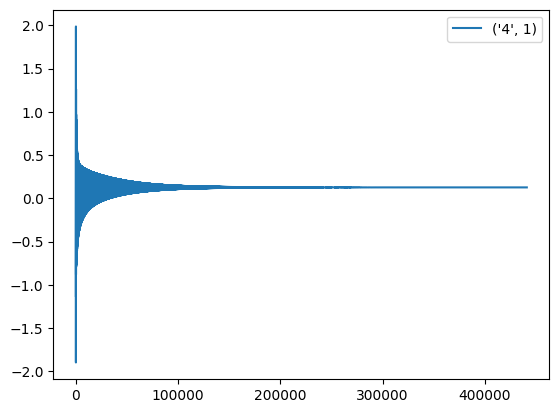

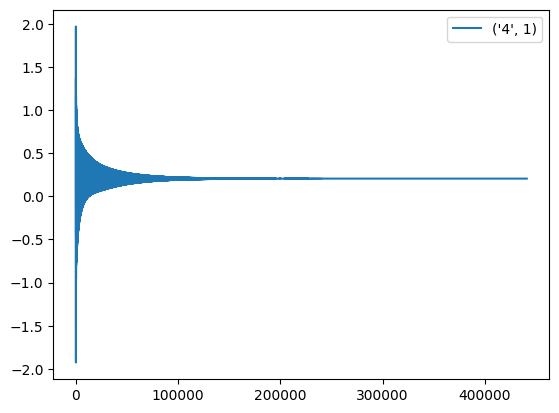

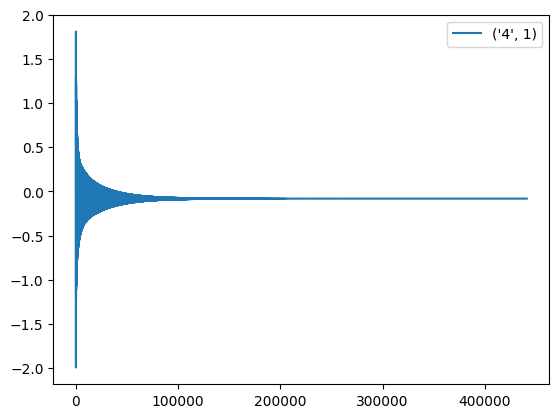

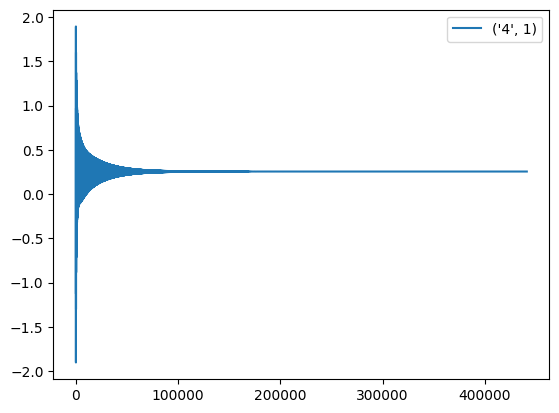

In [74]:
freq = list(frequencies.values())
freq.sort()
for i in melody:
    note = make_note(get_freq(i[0]), 44100, 10)
    plt.plot(np.array(range(len(note))), note, label = str(ele))
    plt.legend()
    plt.show()